# Before Start
This notebook is a toy example of Adversarial Regularizers (AdReg). We add a linear operator and noise to the images from MNISIT Dataset. We want to recover these images. This is a simple inverse problem, but because of noise added into images, directely using least square method or camputing inverse linear operator is not an idea solution. In this notebook, we introduce a Machine Learning based model, known as [Adversarial Regularizers](https://proceedings.neurips.cc/paper/2018/file/d903e9608cfbf08910611e4346a0ba44-Paper.pdf)

In [1]:
import torch
from data import *
import matplotlib.pyplot as plt
# import pytorch_lightning as pl
from model import *
from util import *
from optimizer import *

%load_ext autoreload
%autoreload 2

/Users/zymkong/Projects/PolyU/yiming/envs/others/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# A Forward Problem
Add a linear operator to images. Linear operator A is a matrix sampled from standard normal distribution

In [2]:
### use fixed random seed
seed=123
torch.manual_seed(seed)
coeff_matrix= torch.randn(28, 28)
batch_size=64
# coeff_matrix

# MNIST Dataset Loading and Adding Gaussian Noise

In [3]:
train_loader, valid_loader, test_loader = get_dataloaders_mnist(batch_size=batch_size, coeff_matrix=coeff_matrix, num_workers=0, validation_fraction=0.20, std=0.1, mean=0)
len(train_loader), len(valid_loader), len(test_loader)

(750, 187, 156)

In [4]:
print('Training Set:\n')
for images, labels, noises in train_loader:  
    print('Image batch dimensions:', images.size())
    print('Image label dimensions:', labels.size())
    print('Image noise dimensions:', noises.size())
    # print(labels[:10])
    break
    
# Checking the dataset
print('\nValidation Set:')
for images, labels, noises in valid_loader:  
    print('Image batch dimensions:', images.size())
    print('Image label dimensions:', labels.size())
    print('Image noise dimensions:', noises.size())
    # print(labels[:10])
    break

# Checking the dataset
print('\nTesting Set:')
for images, labels, noises in test_loader:  
    print('Image batch dimensions:', images.size())
    print('Image label dimensions:', labels.size())
    print('Image noise dimensions:', noises.size())
    # print(labels[:10])
    break

Training Set:

Image batch dimensions: torch.Size([64, 1, 28, 28])
Image label dimensions: torch.Size([64])
Image noise dimensions: torch.Size([64, 1, 28, 28])

Validation Set:
Image batch dimensions: torch.Size([64, 1, 28, 28])
Image label dimensions: torch.Size([64])
Image noise dimensions: torch.Size([64, 1, 28, 28])

Testing Set:
Image batch dimensions: torch.Size([64, 1, 28, 28])
Image label dimensions: torch.Size([64])
Image noise dimensions: torch.Size([64, 1, 28, 28])


# Visualization of Ground Truth and Measurements

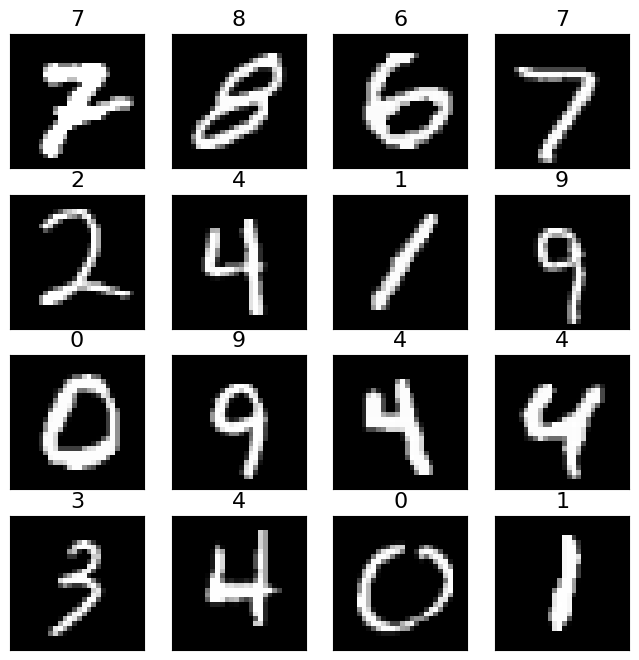

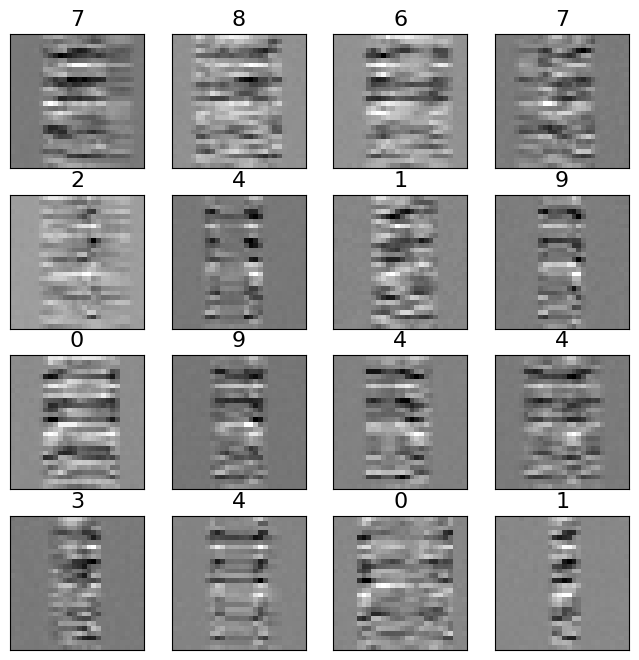

In [5]:
torch.manual_seed(seed)
fig, axs = plt.subplots(4,4,figsize=(8, 8))
fig_0, axes = plt.subplots(4,4,figsize=(8, 8))
no_images = axs.shape[0] * axs.shape[1]
axs = axs.reshape(-1)
axes = axes.reshape(-1)
end=16
for images, labels, noises in valid_loader:  
    for i, image in enumerate(images[0:end]):
        axs[i].imshow(image.reshape(image.shape[-2:]),cmap='gray')
        axs[i].set_title(labels[i].item(), fontsize=16)
        axs[i].get_xaxis().set_ticks([]), axs[i].get_yaxis().set_ticks([])
    for i, noise in enumerate(noises[0:end]):    
        axes[i].imshow(noise.reshape(noise.shape[-2:]),cmap='gray')
        axes[i].set_title(labels[i].item(), fontsize=16)
        axes[i].get_xaxis().set_ticks([]), axes[i].get_yaxis().set_ticks([])
    break  
fig.savefig("figures/MNIST_data_gr.png")
fig_0.savefig("figures/MNIST_data_measurments.png")

# Visulization of Ground Truth and inverse solution from the least square method

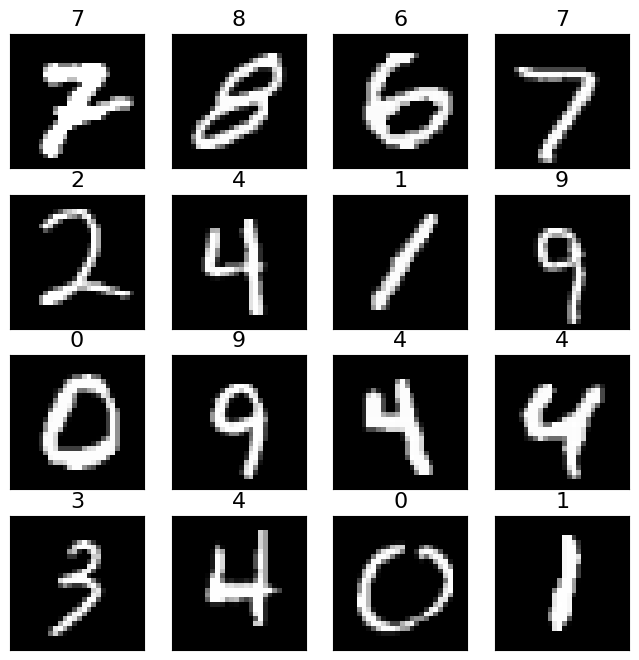

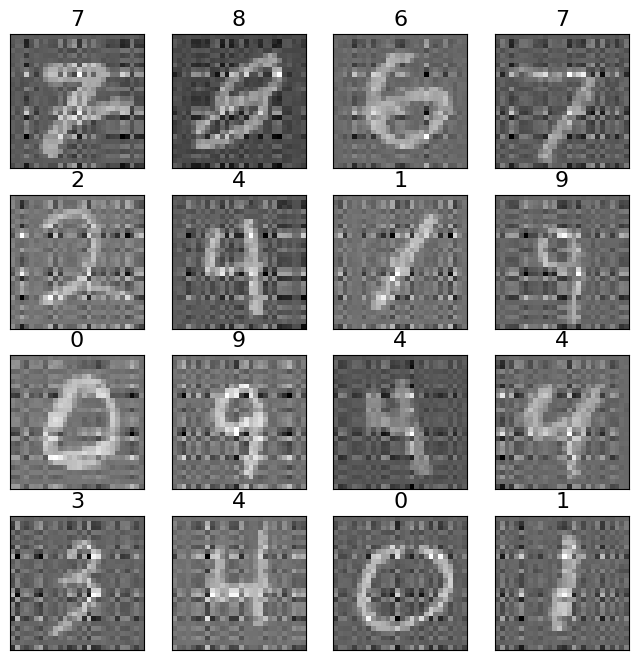

In [6]:
torch.manual_seed(seed)
instance_batch=get_batch_instance(valid_loader)
instance_batch['image'].size()
initial_guess = get_initial_guess(noises=instance_batch['noise'], coeff_matrix=coeff_matrix, grad_requires=False)
fig, axs = plt.subplots(4,4,figsize=(8, 8))
fig_0, axes = plt.subplots(4,4,figsize=(8, 8))
no_images = axs.shape[0] * axs.shape[1]
axs = axs.reshape(-1)
axes = axes.reshape(-1)
end=16
for i, image in enumerate(instance_batch['image'][0:end]):
    axs[i].imshow(image.reshape(image.shape[-2:]),cmap='gray')
    axs[i].set_title(instance_batch['label'][i].item(), fontsize=16)
    axs[i].get_xaxis().set_ticks([]), axs[i].get_yaxis().set_ticks([])
for i, noise in enumerate(initial_guess[0:end]):    
    axes[i].imshow(noise.reshape(noise.shape[-2:]),cmap='gray')
    axes[i].set_title(instance_batch['label'][i].item(), fontsize=16)
    axes[i].get_xaxis().set_ticks([]), axes[i].get_yaxis().set_ticks([])

fig.savefig("figures/MNIST_data_vs_gr.png")
fig_0.savefig("figures/MNIST_data_vs_lstsq.png")

# Hyperparameters

In [7]:
h_params = {
    'input_channels':1,
    'epochs':3,
    'lambda':0.001,
    'coeff_matrix': coeff_matrix,
    'mu':1.5,
    'step_size':100,
    'lr':1e-4,
    'gamma':0.9,
    'batch_size':64,
    'opt_name': "RMSprop"
}

In [8]:
model = Conv(h_params=h_params)

In [9]:
import os
os.environ["WANDB_API_KEY"] = "9168bec9c57359bde71178e40f0eb6d9e2daabdb"

import wandb
wandb.login()

device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
print(f"Using device: {device}")
model.to(device)


wandb: Currently logged in as: zymkong (zymkong-the-hong-kong-polytechnic-university) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


Using device: mps


Conv(
  (model): Sequential(
    (0): Conv2d(1, 16, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (1): ReLU()
    (2): Conv2d(16, 32, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (3): ReLU()
    (4): Conv2d(32, 32, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (5): ReLU()
    (6): Conv2d(32, 64, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (7): ReLU()
    (8): Conv2d(64, 64, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (9): ReLU()
    (10): Conv2d(64, 128, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (11): ReLU()
    (12): Flatten(start_dim=1, end_dim=-1)
    (13): Linear(in_features=512, out_features=1, bias=True)
  )
)

In [11]:
run_name = h_params['opt_name']
model.train_regularization(train_loader, valid_loader, run_name=run_name, device=device)


wandb: WARNING Using a boolean value for 'reinit' is deprecated. Use 'return_previous' or 'finish_previous' instead.


epoch 0, train_loss -5.5419281125068665e-05
epoch 0, val_loss 9.909085929393768e-05
learning rate of 0th epoch is 0.0001
epoch 0, train_loss -2.8219074010849e-07
epoch 0, val_loss -3.4924596548080444e-07
learning rate of 0th epoch is 0.0001
epoch 0, train_loss -3.3527612686157227e-07
epoch 0, val_loss -3.6135315895080566e-07
learning rate of 0th epoch is 0.0001
epoch 0, train_loss -4.637986421585083e-07
epoch 0, val_loss -3.8836151361465454e-07
learning rate of 0th epoch is 0.0001
epoch 0, train_loss -5.252659320831299e-07
epoch 0, val_loss -5.830079317092896e-07
learning rate of 0th epoch is 0.0001
epoch 0, train_loss -7.599592208862305e-07
epoch 0, val_loss -6.50063157081604e-07
learning rate of 0th epoch is 0.0001
epoch 0, train_loss -8.89413058757782e-07
epoch 0, val_loss -8.204951882362366e-07
learning rate of 0th epoch is 0.0001
epoch 0, train_loss -1.0421499609947205e-06
epoch 0, val_loss -1.0151416063308716e-06
learning rate of 0th epoch is 0.0001
epoch 0, train_loss -1.3932585

epoch,▁▁▁▁▁▁▁▁▁▁▁▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅██████████████
train/loss,████▇▄▃▃▂▂▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val/loss,█▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁
epoch,2
train/loss,-41.12738
val/loss,-41.79555


In [64]:
torch.manual_seed(seed)
inputs, labels, noises = next(iter(valid_loader))
batch_instance ={'images': inputs,
                 'labels': labels,
                 'noises': noises}
                 

In [65]:
image, noise = inversion_solver(model=model,
                    lr=1e-2, 
                    batch=batch_instance, 
                    Lambda=80, epochs=1500, AdReg=True)

epoch 0, train_loss 3639.92333984375
epoch 1, train_loss 3524.233642578125
epoch 2, train_loss 3406.279052734375
epoch 3, train_loss 3287.19921875
epoch 4, train_loss 3170.82568359375
epoch 5, train_loss 3055.04736328125
epoch 6, train_loss 2940.07275390625
epoch 7, train_loss 2828.64404296875
epoch 8, train_loss 2720.844482421875
epoch 9, train_loss 2616.29443359375
epoch 10, train_loss 2514.675537109375
epoch 11, train_loss 2414.91650390625
epoch 12, train_loss 2317.3115234375
epoch 13, train_loss 2222.746826171875
epoch 14, train_loss 2129.85302734375
epoch 15, train_loss 2039.02978515625
epoch 16, train_loss 1950.7685546875
epoch 17, train_loss 1864.820556640625
epoch 18, train_loss 1780.6204833984375
epoch 19, train_loss 1698.409423828125
epoch 20, train_loss 1617.8411865234375
epoch 21, train_loss 1538.6748046875
epoch 22, train_loss 1461.112060546875
epoch 23, train_loss 1385.222900390625
epoch 24, train_loss 1311.14892578125
epoch 25, train_loss 1238.50439453125
epoch 26, train

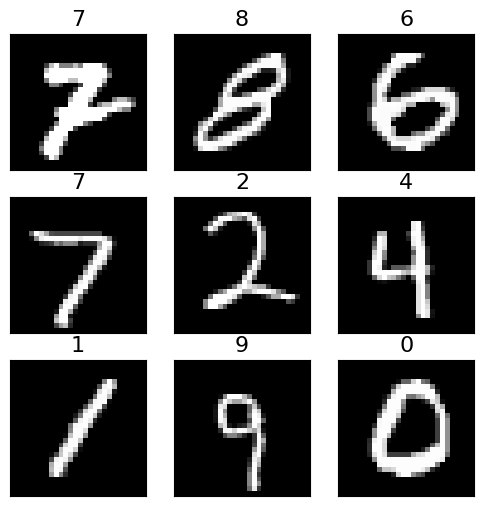

In [66]:
torch.manual_seed(1234)
fig, axs = plt.subplots(3,3,figsize=(6, 6))
axs=axs.reshape(-1)
for i, image_np in enumerate(image[0:9]):
    gr = batch_instance['images'][i][None,]
    axs[i].imshow(gr.reshape(gr.shape[-2:]),cmap='gray')
    axs[i].set_title(batch_instance['labels'][i].item(), fontsize=16)
    axs[i].get_xaxis().set_ticks([]), axs[i].get_yaxis().set_ticks([])
plt.show()
fig.savefig("figures/MNIST_gr_val.png")

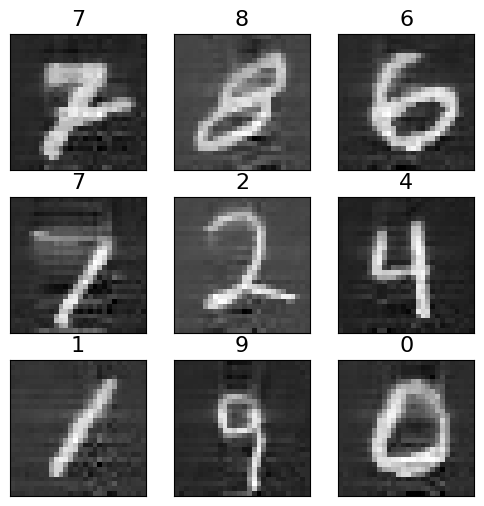

In [67]:
fig, axs = plt.subplots(3,3,figsize=(6, 6))
axs=axs.reshape(-1)
for i, image_np in enumerate(image[0:9]):
    axs[i].imshow(image_np.detach().cpu().numpy().reshape(batch_instance['images'][i][None,].shape[-2:]),cmap='gray')
    axs[i].set_title(batch_instance['labels'][i].item(), fontsize=16)
    axs[i].get_xaxis().set_ticks([]), axs[i].get_yaxis().set_ticks([])


plt.show()


fig.savefig(f"figures/MNIST_recovered_{h_params['opt_name']}_ val.png")

In [83]:
image_no_reg, noise_no_reg = inversion_solver(model=model,
                    lr=1e-2, 
                    batch=batch_instance, 
                    Lambda=0, epochs=1500)

epoch 0, train_loss 4.0638400977677236e-10
epoch 1, train_loss 3.4525065422058105
epoch 2, train_loss 0.42554157972335815
epoch 3, train_loss 0.8822609186172485
epoch 4, train_loss 1.8057781457901
epoch 5, train_loss 1.3766988515853882
epoch 6, train_loss 0.5805307030677795
epoch 7, train_loss 0.26229262351989746
epoch 8, train_loss 0.47577643394470215
epoch 9, train_loss 0.7515510320663452
epoch 10, train_loss 0.7389944791793823
epoch 11, train_loss 0.49097785353660583
epoch 12, train_loss 0.2538544833660126
epoch 13, train_loss 0.1899174302816391
epoch 14, train_loss 0.27263742685317993
epoch 15, train_loss 0.3633752167224884
epoch 16, train_loss 0.357404500246048
epoch 17, train_loss 0.2617577016353607
epoch 18, train_loss 0.15773098170757294
epoch 19, train_loss 0.11539927124977112
epoch 20, train_loss 0.13921715319156647
epoch 21, train_loss 0.17822770774364471
epoch 22, train_loss 0.1820896863937378
epoch 23, train_loss 0.1434807926416397
epoch 24, train_loss 0.0944332703948021
e

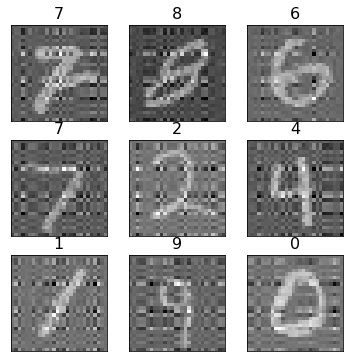

In [84]:
fig, axs = plt.subplots(3,3,figsize=(6, 6))
axs=axs.reshape(-1)
for i, image_np in enumerate(image_no_reg[0:9]):
    axs[i].imshow(image_np.detach().numpy().reshape(batch_instance['images'][i][None,].shape[-2:]),cmap='gray')
    axs[i].set_title(batch_instance['labels'][i].item(), fontsize=16)
    axs[i].get_xaxis().set_ticks([]), axs[i].get_yaxis().set_ticks([])


plt.show()


fig.savefig("figures/MNIST_recovered_no_reg.png")

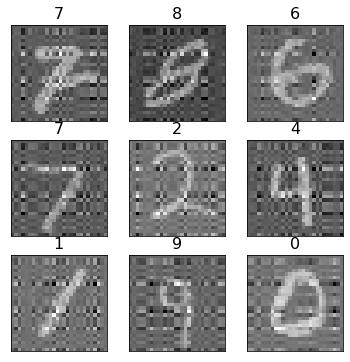

In [85]:
initial_guess = get_initial_guess(model.coeff_matrix, batch_instance['noises'], grad_requires=False)
fig, axs = plt.subplots(3,3,figsize=(6, 6))
axs=axs.reshape(-1)
for i, image_np in enumerate(image_no_reg[0:9]):
    guess = initial_guess[i][None,]
    axs[i].imshow(guess.reshape(initial_guess.shape[-2:]),cmap='gray')
    axs[i].set_title(batch_instance['labels'][i].item(), fontsize=16)
    axs[i].get_xaxis().set_ticks([]), axs[i].get_yaxis().set_ticks([])

plt.show()
fig.savefig("figures/MNIST_lstsq_.png")

In [86]:
image_reg, noise_reg = inversion_solver(model=model,
                    lr=1e-2, 
                    batch=batch_instance, 
                    Lambda=20, epochs=1000, AdReg=False)

epoch 0, train_loss 4287.560546875
epoch 1, train_loss 4180.98583984375
epoch 2, train_loss 4079.609375
epoch 3, train_loss 3983.001220703125
epoch 4, train_loss 3890.701416015625
epoch 5, train_loss 3802.378662109375
epoch 6, train_loss 3717.76904296875
epoch 7, train_loss 3636.652099609375
epoch 8, train_loss 3558.835205078125
epoch 9, train_loss 3484.152099609375
epoch 10, train_loss 3412.447509765625
epoch 11, train_loss 3343.5732421875
epoch 12, train_loss 3277.3916015625
epoch 13, train_loss 3213.781005859375
epoch 14, train_loss 3152.630859375
epoch 15, train_loss 3093.831298828125
epoch 16, train_loss 3037.27001953125
epoch 17, train_loss 2982.8369140625
epoch 18, train_loss 2930.424560546875
epoch 19, train_loss 2879.935791015625
epoch 20, train_loss 2831.27685546875
epoch 21, train_loss 2784.3583984375
epoch 22, train_loss 2739.101318359375
epoch 23, train_loss 2695.433349609375
epoch 24, train_loss 2653.291748046875
epoch 25, train_loss 2612.618408203125
epoch 26, train_loss

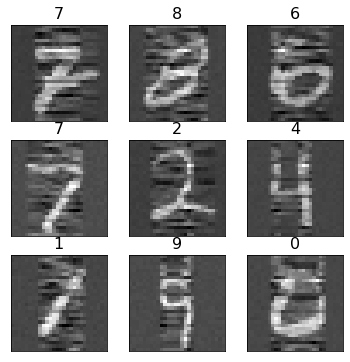

In [87]:
fig, axs = plt.subplots(3,3,figsize=(6, 6))
axs=axs.reshape(-1)
for i, image_np in enumerate(image_reg[0:9]):
    axs[i].imshow(image_np.detach().numpy().reshape(batch_instance['images'][i][None,].shape[-2:]),cmap='gray')
    axs[i].set_title(batch_instance['labels'][i].item(), fontsize=16)
    axs[i].get_xaxis().set_ticks([]), axs[i].get_yaxis().set_ticks([])


plt.show()


fig.savefig("figures/MNIST_l2_reg_image.png")

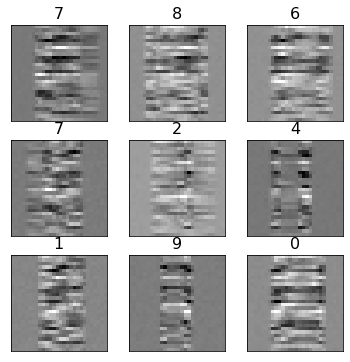

In [88]:
fig, axs = plt.subplots(3,3,figsize=(6, 6))
axs=axs.reshape(-1)
for i, image_np in enumerate(image_no_reg[0:9]):
    axs[i].imshow(batch_instance['noises'][i].reshape(gr.shape[-2:]),cmap='gray')
    axs[i].set_title(batch_instance['labels'][i].item(), fontsize=16)
    axs[i].get_xaxis().set_ticks([]), axs[i].get_yaxis().set_ticks([])


plt.show()
fig.savefig("figures/MNIST_measurements.png")

In [89]:
batch_size=batch_instance['images'].size(0)
loss_recovered = Frobenius_distance(batch_instance, image, batch_size)
loss_no_reg = Frobenius_distance(batch_instance, image_no_reg, batch_size)
loss_var_reg = Frobenius_distance(batch_instance, image_reg, batch_size)
loss_lsq = Frobenius_distance(batch_instance, initial_guess, batch_size)


In [90]:
loss_recovered, loss_no_reg, loss_var_reg, loss_lsq

(tensor([2.0169], grad_fn=<DivBackward0>),
 tensor([8.1609], grad_fn=<DivBackward0>),
 tensor([5.4016], grad_fn=<DivBackward0>),
 tensor([8.1608]))